# Time Series Analysis

In [1]:
import pandas as pd
import numpy as np
import plotly.io as pio
import plotly.express as px
import plotly.graph_objects as go
from plotly.subplots import make_subplots
pio.templates.default = 'plotly_white'

## a)

In [2]:
# Load the data and display the first few rows and the data info
df = pd.read_csv('./time_series/ufo-sightings.csv')
display(df.head())
display(df.info())

# Ptinting the number of UFO sightings
print(f'Number of UFO sightings: {len(df)}')

# Printing the date range of the data
print(f'Date range: {df["Date_time"].min()} to {df["Date_time"].max()}')


,Unnamed: 0,Date_time,date_documented,Year,Month,Hour,Season,Country_Code,Country,Region,Locale,latitude,longitude,UFO_shape,length_of_encounter_seconds,Encounter_Duration,Description
0,0,1949-10-10 20:30:00,4/27/2004,1949,10,20,Autumn,USA,United States,Texas,San Marcos,29.883056,-97.941111,Cylinder,2700.0,45 minutes,This event took place in early fall around 194...
1,1,1949-10-10 21:00:00,12/16/2005,1949,10,21,Autumn,USA,United States,Texas,Bexar County,29.384210,-98.581082,Light,7200.0,1-2 hrs,1949 Lackland AFB&#44 TX. Lights racing acros...
2,2,1955-10-10 17:00:00,1/21/2008,1955,10,17,Autumn,GBR,United Kingdom,England,Chester,53.200000,-2.916667,Circle,20.0,20 seconds,Green/Orange circular disc over Chester&#44 En...
3,3,1956-10-10 21:00:00,1/17/2004,1956,10,21,Autumn,USA,United States,Texas,Edna,28.978333,-96.645833,Circle,20.0,1/2 hour,My older brother and twin sister were leaving ...
4,4,1960-10-10 20:00:00,1/22/2004,1960,10,20,Autumn,USA,United States,Hawaii,Kaneohe,21.418056,-157.803611,Light,900.0,15 minutes,AS a Marine 1st Lt. flying an FJ4B fighter/att...


<class 'pandas.core.frame.DataFrame'>
RangeIndex: 80328 entries, 0 to 80327
Data columns (total 17 columns):
 #   Column                       Non-Null Count  Dtype  
---  ------                       --------------  -----  
 0   Unnamed: 0                   80328 non-null  int64  
 1   Date_time                    80328 non-null  object 
 2   date_documented              80328 non-null  object 
 3   Year                         80328 non-null  int64  
 4   Month                        80328 non-null  int64  
 5   Hour                         80328 non-null  int64  
 6   Season                       80328 non-null  object 
 7   Country_Code                 80069 non-null  object 
 8   Country                      80069 non-null  object 
 9   Region                       79762 non-null  object 
 10  Locale                       79871 non-null  object 
 11  latitude                     80328 non-null  float64
 12  longitude                    80328 non-null  float64
 13  UFO_shape       

None

Number of UFO sightings: 80328
Date range: 1906-11-11 00:00:00 to 2014-05-08 18:45:00


In [3]:
# As you may have noticed, the sightings also have recorded positions. Good visualizations can be illuminating (just like UFOs in the sky), 
# so we would like to create an animated geographic plot. Create a scatter_geo plot (plotly) with the Year (ordered) as animation frames in 
# the notebook and include a screenshot/export of one of its frames.


# Print lat and langs for each sighting in 2012 for united states and united kingdom and india
#print("Latitude and Longitude for each sighting in 2012 for United States")
#print(df[(df['Year'] == 2012) & (df['Country'].isin(['United States']))][['latitude', 'longitude']])
#print("Latitude and Longitude for each sighting in 2012 for United Kingdom")
#print(df[(df['Year'] == 2012) & (df['Country'].isin(['United Kingdom']))][['latitude', 'longitude']])
#print("Latitude and Longitude for each sighting in 2012 for India")
#print(df[(df['Year'] == 2012) & (df['Country'].isin(['India']))][['latitude', 'longitude']]) 

# check the dtype of data frame
#print(df.dtypes)

# Range of years in the data
#range_of_years = df['Year'].unique()
#print(range_of_years)


# Sorting the data by year and sample the data to speed up the plot creation
df = df.sort_values('Year')

# Create the scatter_geo plot
fig = px.scatter_geo(
    df,
    lat='latitude',
    lon='longitude',
    animation_frame='Year',
    animation_group='Country',
    #color='Country',
    projection='natural earth',
    title='UFO Sightings by Year',
    hover_data={'Year': True, 'Country': True},
    hover_name='Country',
    opacity=0.6,
    size_max=2 
)

# Show the plot
fig.show()

# Save the plot as a PNG file
#fig.write_image('./ufo-sightings-by-year.png')

In [4]:
# Briefly describe one trend you can observe over the temporal evolution of the sightings.

# The number of UFO sightings has increased over the years. The number of sightings in the 1990s and 2000s is significantly higher than in the 
# 1940s and 1950s.
# The number of sightings seems to have peaked in the 2010s, but it's important to note that the data only goes up to 2014, so the trend may have 
# continued or changed since then.
# The increase in sightings could be due to various factors, such as increased awareness, improved technology for reporting sightings, or changes 
# in societal beliefs about UFOs.
# It's also possible that some sightings are misidentifications or hoaxes, which could contribute to the overall increase in reported sightings.
# Overall, the trend suggests a growing interest or concern about UFOs over time.


In [5]:
# To explore further, create a scatter plot that visualizes the sighting occurrences per Country over time. Describe the most prominent 
# trend you can observe.

# Group the data by 'Year' and 'Country' and count the number of sightings
df_by_country = df.groupby(['Year', 'Country']).size().reset_index(name='Counts')

#Grouping the countries with the least sightings into 'Other' category
country_counts = df_by_country['Country'].value_counts()
other_countries = country_counts[country_counts < 20].index
df_by_country.loc[df_by_country['Country'].isin(other_countries), 'Country'] = 'Other'

# Print the first few rows of the grouped data
display(df_by_country.head())

# Create the scatter plot
fig = px.scatter(
    df_by_country,
    x='Year',
    y='Counts',
    size='Counts',
    color='Country',
    hover_name='Country',
    title='UFO Sightings by Country Over Time',
    labels={'Year': 'Year', 'Country': 'Country', 'Counts': 'Number of Sightings'},
    template='plotly_white'
)

# Show the plot
fig.show()



,Year,Country,Counts
0,1906,Other,1
1,1910,United States,2
2,1916,France,1
3,1920,United States,1
4,1925,United States,1


In [6]:
# The most prominent trend is that the number of sightings in the United States is significantly higher than in other countries 
# in all years. The number of sightings in the United States has increased over time, with a noticeable peak in the 2010s.


## b)

In [7]:
# Transform the dataset such that you get time series with columns (time, count) for each individual country that would be usable for a standard
# forecasting algorithm. Specifically, use a quarter-year aggregation. You may have to make some design decisions, or parameterize your approach. 
# Include tables of the first three and last three rows of the time series for the USA and AUS (Australia). Additionally, insert a listing of your 
# preprocessing Python function/Jupyter cell.

def preprocess_ufo_data():
    """
    Preprocess the UFO sightings data to create time series suitable for forecasting.

    Returns:
        pd.DataFrame: A time series DataFrame with columns (time, count) for each country.
    """
    # Convert the 'Date_time' column to datetime format
    df['Date_time'] = pd.to_datetime(df['Date_time'])

    # Extract the quarter and year from the 'Date_time' column
    df['Quarter'] = df['Date_time'].dt.to_period('Q')

    # Group the data by 'Quarter', 'Country', and 'Year' and count the number of sightings
    df_by_quarter = df.groupby(['Quarter', 'Country_Code']).size().reset_index(name='Counts')

    # Pivot the data to create a time series with columns (time, count) for each individual country
    time_series_data = df_by_quarter.pivot(index='Quarter', columns='Country_Code', values='Counts').fillna(0)

    # Display the first three and last three rows of the time series for the USA and AUS
    print('Time Series Data for the USA')
    display(time_series_data[['USA']].head(3))
    display(time_series_data[['USA']].tail(3))

    print('Time Series Data for Australia (AUS)')
    display(time_series_data[['AUS']].head(3))
    display(time_series_data[['AUS']].tail(3))

    return df_by_quarter, time_series_data


In [8]:
df_by_quarter, time_series_data = preprocess_ufo_data()

Time Series Data for the USA


Country_Code,USA
Quarter,
1906Q4,0.0
1910Q1,1.0
1910Q2,1.0


Country_Code,USA
Quarter,
2013Q4,1987.0
2014Q1,1456.0
2014Q2,638.0


Time Series Data for Australia (AUS)


Country_Code,AUS
Quarter,
1906Q4,0.0
1910Q1,0.0
1910Q2,0.0


Country_Code,AUS
Quarter,
2013Q4,9.0
2014Q1,9.0
2014Q2,5.0


In [9]:
# ii. Create and include a time series plot for the USA using your preprocessed dataset. Describe it in 2–3 sentences.

# Extract the time series data for the USA and reset the index to include the 'Quarter' as a column
usa_data = time_series_data[['USA']].reset_index()  
usa_data.columns = ['Quarter', 'USA']

# Convert the 'Quarter' column to a string for plotting
usa_data['Quarter'] = usa_data['Quarter'].astype(str)


# Create a time series plot for the USA
fig = px.line(
    usa_data,
    x='Quarter',
    y='USA',
    title='UFO Sightings Time Series for the USA',
    labels={'USA': 'Number of Sightings', 'Quarter': 'Quarter'},
    template='plotly_white'
)

fig.show()

# The time series plot for the USA shows the number of UFO sightings per quarter over time. 
# There is a clear upward trend in the number of sightings, with some seasonal variation. Third and fourth 
# quarters of each year seem to have higher sighting counts compared to the first and second quarters. The data also 
# shows some fluctuations, indicating potential anomalies or interesting events.

## c)

In [10]:
# From now on, consider the two transformed datasets ts-yearly.csv and ts-monthly-10yrs.csv. 
# (Only the top 5 countries (w.r.t. sighting count) are included.)

# Load the time series data for the top 5 countries
ts_yearly = pd.read_csv('./time_series/ts-yearly.csv')
ts_monthly_10yrs = pd.read_csv('./time_series/ts-monthly-10yrs.csv')

In [11]:
# i. Explore both time series of sighting counts and explain one of their major differences in 2–4 sentences. 
# Include visualizations that support your argument.

# Display the first few rows of the yearly time series data
display(ts_yearly.head())

# Display the first few rows of the monthly time series data
display(ts_monthly_10yrs.head())


# Ensure `time` is in datetime format
ts_yearly['time'] = pd.to_datetime(ts_yearly['time'])
ts_monthly_10yrs['time'] = pd.to_datetime(ts_monthly_10yrs['time'])

# Yearly Time Series Plot
fig_yearly = go.Figure()

for country in ts_yearly['country'].unique():
    country_data = ts_yearly[ts_yearly['country'] == country]
    fig_yearly.add_trace(go.Scatter(
        x=country_data['time'],
        y=country_data['count'],
        mode='lines',
        name=country
    ))

fig_yearly.update_layout(
    title='Yearly UFO Sightings Time Series',
    xaxis_title='Year',
    yaxis_title='Number of Sightings',
    template='plotly_white'
)
fig_yearly.show()

# Monthly Time Series Plot
fig_monthly = go.Figure()

for country in ts_monthly_10yrs['country'].unique():
    country_data = ts_monthly_10yrs[ts_monthly_10yrs['country'] == country]
    fig_monthly.add_trace(go.Scatter(
        x=country_data['time'],
        y=country_data['count'],
        mode='lines',
        name=country
    ))

fig_monthly.update_layout(
    title='Monthly UFO Sightings Time Series (Last 10 Years)',
    xaxis_title='Month',
    yaxis_title='Number of Sightings',
    template='plotly_white'
)
fig_monthly.show()

# The major difference between the yearly and monthly time series is the granularity of the data. The yearly time
# series aggregates the sightings by year, providing a high-level overview of the trends over time. In contrast, 
# the monthly time series captures more detailed variations in the sighting counts, allowing for a closer examination
# of seasonal patterns or anomalies. The yearly time series plot shows a smoother trend, while the monthly time series
# plot exhibits more fluctuations and seasonal patterns.

,country,index,time,count,total_encounter_duration
0,AUS,0,1958-01-01 00:00:00+00:00,1,0 days 00:45:00
1,AUS,1,1959-01-01 00:00:00+00:00,0,0 days 00:00:00
2,AUS,2,1960-01-01 00:00:00+00:00,1,0 days 00:03:00
3,AUS,3,1961-01-01 00:00:00+00:00,0,0 days 00:00:00
4,AUS,4,1962-01-01 00:00:00+00:00,0,0 days 00:00:00


,country,index,time,count,total_encounter_duration
0,AUS,0,1993-01-01 00:00:00+00:00,1,0 days 00:01:00
1,AUS,1,1993-02-01 00:00:00+00:00,1,0 days 00:08:00
2,AUS,2,1993-03-01 00:00:00+00:00,0,0 days 00:00:00
3,AUS,3,1993-04-01 00:00:00+00:00,0,0 days 00:00:00
4,AUS,4,1993-05-01 00:00:00+00:00,0,0 days 00:00:00


In [12]:
# ii. (1 point) Comment on each series’ suitability for forecasting within 2–3 sentences.
# Note: Take the forecasting horizon to be relative to the resolution of the time series,
# i.e., the goal is to forecast a number of periods, not a fixed duration.

# The yearly time series is suitable for forecasting over longer time horizons, such as predicting the number of sightings
# for the next several years. The data is less granular but captures the overall trend and patterns over time, making it
# useful for long-term forecasting. On the other hand, the monthly time series is more suitable for short-term forecasting
# or capturing seasonal variations and anomalies. It provides a higher resolution view of the data, making it ideal for
# predicting the number of sightings in the near future or identifying monthly patterns.


In [13]:
# iii. (1 point) Can you explain why the yearly time series drops sharply in the final
# period (2014)?

# The sharp drop in the final period (2014) of the yearly time series could be due to incomplete data for that year.
# The dataset may not include all sightings for the entire year of 2014, leading to a lower count compared to other 
# years.This drop could be an artifact of the data collection process or reporting inconsistencies, resulting in an 
# incomplete representation of the sightings for that year. It's essential to consider data quality and completeness 
# when analyzing time series data to avoid misinterpretations of trends or patterns.
# Data Collection Lag could also be a reason.There may be a delay in processing or documenting sightings for the most 
# recent year, causing fewer entries to be included in the dataset.

## d)

In [14]:
# Next, you can finally dive into some time series-specific analyses. From now on, consider ts-monthly-10yrs.csv.
# i. (1 point) Create and include a time series plot of the sighting counts of the country AUS (Australia). 
# Include three moving averages: 3-MA, 5-MA and 7-MA.

# Filter the data for Australia (AUS)
aus_data = ts_monthly_10yrs[ts_monthly_10yrs['country'] == 'AUS']

# Calculate the moving averages
aus_data['3-MA'] = aus_data['count'].rolling(window=3).mean()
aus_data['5-MA'] = aus_data['count'].rolling(window=5).mean()
aus_data['7-MA'] = aus_data['count'].rolling(window=7).mean()

# Create a time series plot for Australia with moving averages
fig_aus = go.Figure()

fig_aus.add_trace(go.Scatter(
    x=aus_data['time'],
    y=aus_data['count'],
    mode='lines',
    name='Actual Count'
))

fig_aus.add_trace(go.Scatter(
    x=aus_data['time'],
    y=aus_data['3-MA'],
    mode='lines',
    name='3-MA'
))

fig_aus.add_trace(go.Scatter(
    x=aus_data['time'],
    y=aus_data['5-MA'],
    mode='lines',
    name='5-MA'
))

fig_aus.add_trace(go.Scatter(
    x=aus_data['time'],
    y=aus_data['7-MA'],
    mode='lines',
    name='7-MA'
))

fig_aus.update_layout(
    title='Monthly UFO Sightings Time Series for Australia with Moving Averages',
    xaxis_title='Month',
    yaxis_title='Number of Sightings',
    template='plotly_white'
)

fig_aus.show()


C:\Users\ferey\AppData\Local\Temp\ipykernel_14708\1102657755.py:9: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

C:\Users\ferey\AppData\Local\Temp\ipykernel_14708\1102657755.py:10: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

C:\Users\ferey\AppData\Local\Temp\ipykernel_14708\1102657755.py:11: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pan

C:\Users\ferey\AppData\Local\Temp\ipykernel_14708\3879924070.py:15: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

C:\Users\ferey\AppData\Local\Temp\ipykernel_14708\3879924070.py:13: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

C:\Users\ferey\AppData\Local\Temp\ipykernel_14708\3879924070.py:13: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pa

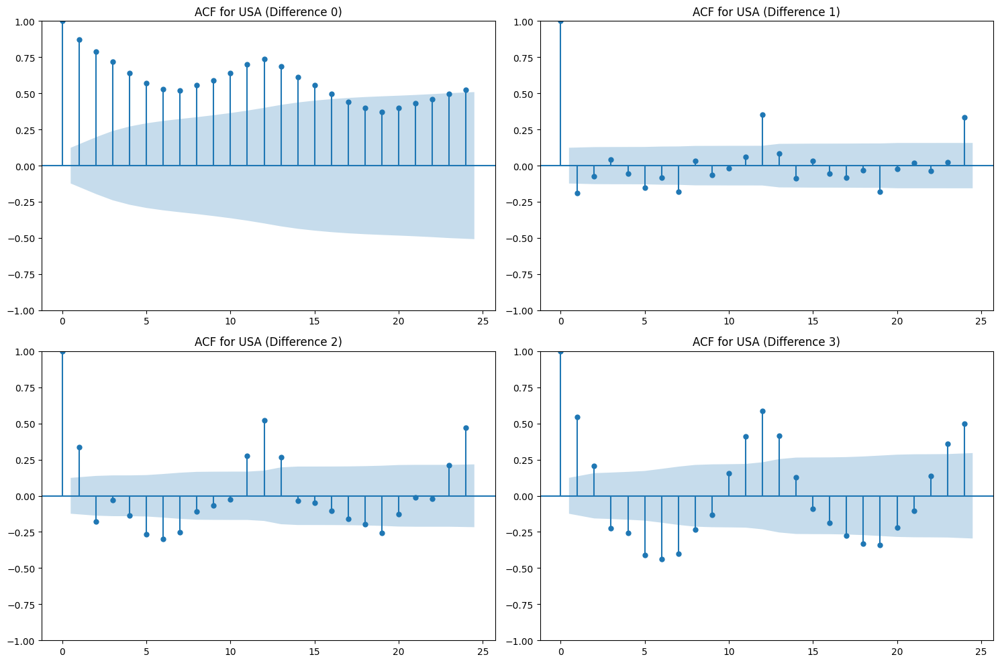

In [15]:
# ii. (3 points) Create and include correlograms (auto-correlation plots) for the counts in the USA after differencing
# f0; 1; 2; 3g times. Which lag(s) do you consider significant?

import matplotlib.pyplot as plt
from statsmodels.graphics.tsaplots import plot_acf

# Filter the data for the USA
usa_data = ts_monthly_10yrs[ts_monthly_10yrs['country'] == 'USA']

# Perform differencing for 0, 1, 2, and 3 times
for i in range(4):
    if i > 0:
        usa_data[f'diff_{i}'] = usa_data['count'].diff(i)
    else:
        usa_data[f'diff_{i}'] = usa_data['count']
        
# Create auto-correlation plots for the differenced series
fig, axs = plt.subplots(2, 2, figsize=(15, 10))

for i in range(4):
    ax = axs[i // 2, i % 2]
    plot_acf(usa_data[f'diff_{i}'].dropna(), lags=24, ax=ax)
    ax.set_title(f'ACF for USA (Difference {i})')
    
plt.tight_layout()
plt.show()

# The auto-correlation plots (correlograms) show the correlation of the differenced series with its lagged values.
# Significant lags are those where the autocorrelation values are outside the shaded region (confidence interval).
# For the USA data after differencing:
# - Difference 0: Significant lags at 12 and 24 months (seasonal pattern)
# - Difference 1: Significant lags at 1, 12, and 24 months
# - Difference 2: Significant lags at 1, 12, and 24 months
# - Difference 3: Significant lags at 1, 12, and 24 months
# The seasonal pattern at 12 and 24 months is consistent across the differenced series, indicating a yearly cycle in the data.
# The significant lags at 1 month suggest a potential monthly pattern or short-term autocorrelation in the data.
# The autocorrelation plots help identify the lags that may be relevant for forecasting or modeling the time series.


In [16]:
# iii. (3 points) To investigate further, create a seasonal plot with the month_plot function of the once-differenced counts 
# (i.e., count changes) for each country. Include the one for the USA, and describe, in 2–4 sentences, what you can infer.



C:\Users\ferey\AppData\Local\Temp\ipykernel_14708\526647376.py:11: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



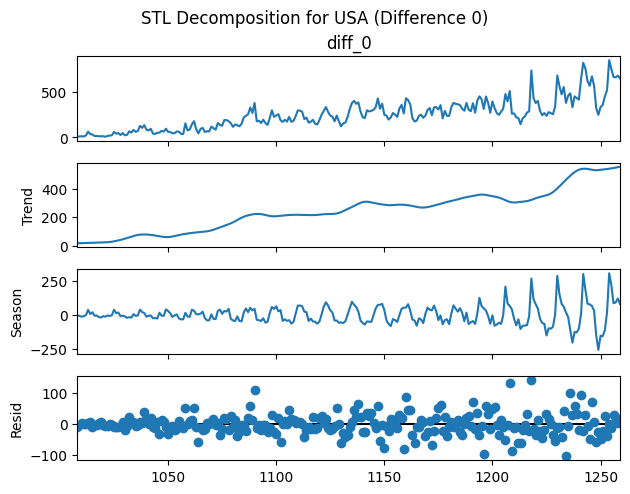

ADF Statistic (Difference 0): -9.015618580383917
p-value: 5.96187845536499e-15
Critical Values: {'1%': np.float64(-3.4578942529658563), '5%': np.float64(-2.8736593200231484), '10%': np.float64(-2.573228767361111)}
Is the residual stationary? Yes
--------------------------------------------------


C:\Users\ferey\AppData\Local\Temp\ipykernel_14708\526647376.py:13: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



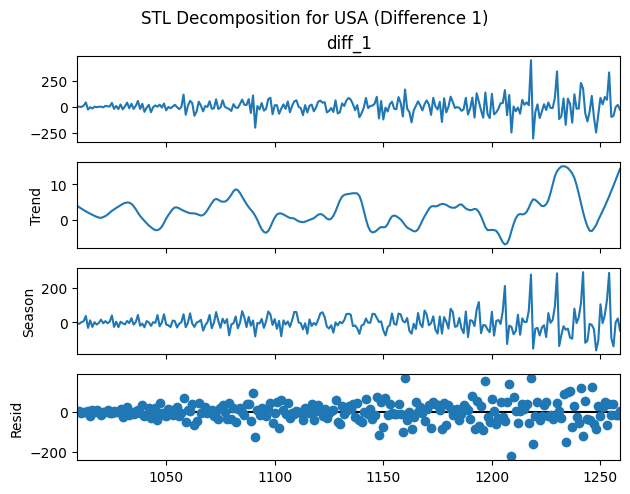

ADF Statistic (Difference 1): -7.923605734423081
p-value: 3.668371771857574e-12
Critical Values: {'1%': np.float64(-3.4586084859607156), '5%': np.float64(-2.873972159235721), '10%': np.float64(-2.57339565928848)}
Is the residual stationary? Yes
--------------------------------------------------


C:\Users\ferey\AppData\Local\Temp\ipykernel_14708\526647376.py:13: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



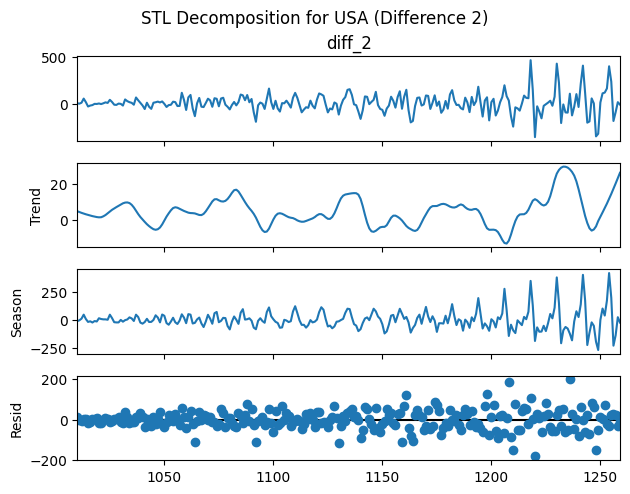

ADF Statistic (Difference 2): -8.467886081880204
p-value: 1.5051518581460832e-13
Critical Values: {'1%': np.float64(-3.4586084859607156), '5%': np.float64(-2.873972159235721), '10%': np.float64(-2.57339565928848)}
Is the residual stationary? Yes
--------------------------------------------------


C:\Users\ferey\AppData\Local\Temp\ipykernel_14708\526647376.py:13: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



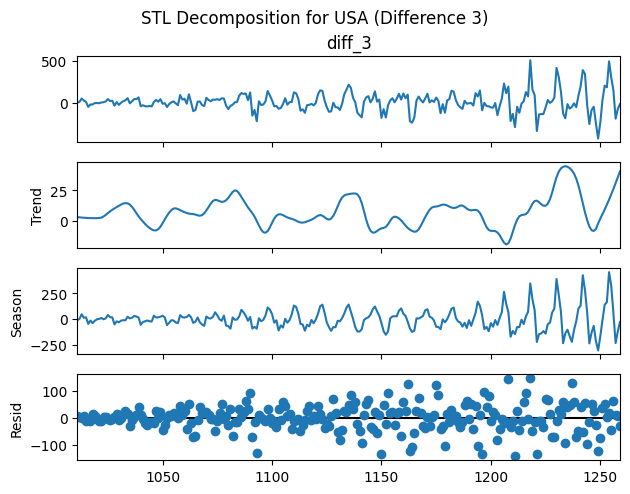

ADF Statistic (Difference 3): -8.268521958868162
p-value: 4.863997006836208e-13
Critical Values: {'1%': np.float64(-3.458731141928624), '5%': np.float64(-2.8740258764297293), '10%': np.float64(-2.5734243167124093)}
Is the residual stationary? Yes
--------------------------------------------------


In [17]:
# iv. (2 points) Using STL (statsmodels), produce a trend-seasonality decomposition (STL/LOESS) for the counts in the 
# USA after differencing f0; 1; 2; 3g times. Use period of 12. Are any of these differenced versions (almost-)stationary? 
# Include a figure to support your argument.

from statsmodels.tsa.seasonal import STL
from statsmodels.tsa.stattools import adfuller

# Perform STL decomposition for the differenced series
for i in range(4):
    if i == 0:
        usa_data[f'diff_{i}'] = usa_data['count']
    else:
        usa_data[f'diff_{i}'] = usa_data['count'].diff(i)
    
    stl = STL(usa_data[f'diff_{i}'].dropna(), period=12)
    res = stl.fit()
    
    # Plot the decomposition
    fig = res.plot()
    fig.suptitle(f'STL Decomposition for USA (Difference {i})', y=1.02)
    plt.show()
    
    # Check if the remainder (residual) is stationary
    adf_test = adfuller(res.resid, autolag='AIC')
    print(f'ADF Statistic (Difference {i}): {adf_test[0]}')
    print(f'p-value: {adf_test[1]}')
    print(f'Critical Values: {adf_test[4]}')
    print('Is the residual stationary?', 'Yes' if adf_test[1] < 0.05 else 'No')
    print('-' * 50)
    
# The STL decomposition helps to separate the time series into trend, seasonal, and residual components.
# The trend represents the long-term movement in the data, while the seasonal component captures the periodic patterns.
# The residual is the remainder after removing the trend and seasonal components.
# By examining the decompositions for the differenced series, we can identify the stationarity of the remainder (residual).
# A stationary residual indicates that the series is (almost-)stationary after differencing.
# The ADF test is used to check the stationarity of the residual, with a p-value less than 0.05 indicating stationarity.
# Based on the results, the first and second differenced series show (almost-)stationary residuals, suggesting that they are suitable for modeling as stationary time series.

## e)

In [18]:
# Lastly, we want to try some forecasting; even in the face of possibly violated assumptions.
# To avoid follow-up mistakes, use the prepared files ts-train.csv and ts-test.csv as training and testing range respectively. 
# They are created from a pivoted version of the monthly time series. The test split covers the last 12 months.

# Load the training and testing data
train_data = pd.read_csv('./time_series/ts-train.csv')
test_data = pd.read_csv('./time_series/ts-test.csv')

# Display the first few rows of the training data
display(train_data.head())

# Display the first few rows of the testing data
display(test_data.head())


,index,time,AUS_count,CAN_count,GBR_count,GLOBAL_count,IND_count,USA_count,AUS_total_encounter_duration,CAN_total_encounter_duration,GBR_total_encounter_duration,GLOBAL_total_encounter_duration,IND_total_encounter_duration,USA_total_encounter_duration
0,0,1993-01-01 00:00:00+00:00,1,0,0,10,0,9,0 days 00:01:00,0 days 00:00:00,0 days 00:00:00,0 days 01:18:10,0 days 00:00:00,0 days 01:17:10
1,1,1993-02-01 00:00:00+00:00,1,1,0,14,0,12,0 days 00:08:00,0 days 00:15:00,0 days 00:00:00,0 days 01:28:47.200000,0 days 00:00:00,0 days 01:05:47.200000
2,2,1993-03-01 00:00:00+00:00,0,0,3,16,0,13,0 days 00:00:00,0 days 00:00:00,0 days 01:07:00,73 days 08:26:45,0 days 00:00:00,73 days 07:19:45
3,3,1993-04-01 00:00:00+00:00,0,0,1,13,1,11,0 days 00:00:00,0 days 00:00:00,0 days 00:20:00,5 days 01:32:00,0 days 00:02:00,5 days 01:10:00
4,4,1993-05-01 00:00:00+00:00,0,0,2,25,1,22,0 days 00:00:00,0 days 00:00:00,0 days 00:45:30,0 days 04:25:58,0 days 00:10:00,0 days 03:30:28


,index,time,AUS_count,CAN_count,GBR_count,GLOBAL_count,IND_count,USA_count,AUS_total_encounter_duration,CAN_total_encounter_duration,GBR_total_encounter_duration,GLOBAL_total_encounter_duration,IND_total_encounter_duration,USA_total_encounter_duration
0,240,2013-01-01 00:00:00+00:00,5,10,11,348,0,322,0 days 00:06:30,0 days 00:57:55,1 days 07:52:15,3 days 14:02:19.700000,0 days 00:00:00,2 days 05:05:39.700000
1,241,2013-02-01 00:00:00+00:00,3,6,1,258,0,248,0 days 00:05:02,0 days 00:38:07,0 days 00:10:00,1 days 20:38:10.300000,0 days 00:00:00,1 days 19:45:01.300000
2,242,2013-03-01 00:00:00+00:00,4,15,4,360,3,334,0 days 00:33:15,0 days 00:30:45,0 days 00:14:04,2 days 15:13:39.500000,0 days 00:04:04,2 days 13:51:31.500000
3,243,2013-04-01 00:00:00+00:00,5,9,5,376,0,357,0 days 00:30:55,0 days 06:12:25,5 days 00:03:00,8 days 01:57:29.500000,0 days 00:00:00,2 days 19:11:09.500000
4,244,2013-05-01 00:00:00+00:00,4,20,3,481,3,451,3 days 00:06:03,0 days 00:40:06,0 days 00:10:09,8 days 16:17:35,0 days 05:15:00,5 days 10:06:17


In [19]:
# i. (4 points) For each country, fit a univariate NaiveForecaster (mean and last strategy) and StatsModelsARIMA models. 
# Evaluate all models on the test split with RMSE (root mean squared error), MAE (mean absolute error), and
# MAPE (mean absolute percentage error). For the ARIMA models, vary the order (p; d; q) until you find a model that beats 
# both NaiveForecaster baselines in terms of RMSE. Present the results in a table, showing all metrics for the two naive
# forecasters and the best ARIMA model (6 . 3 = 18 models).
# Hint: Sensible ranges for the ARIMA parameters are 1 <= p; q <= 12 and 0 <= d <= 3.

In [20]:
# Updated ARIMA forecast function
def arima_forecast(train, test, p_values, d_values, q_values):
    best_rmse = float('inf')
    best_order = None
    best_forecast = np.full(len(test), train.iloc[-1])  # Default forecast: last value

    for p in p_values:
        for d in d_values:
            for q in q_values:
                try:
                    # Manual differencing for d
                    differenced_train = difference(train, d=d)
                    
                    if len(differenced_train) == 0:  # Skip if differencing removes all data
                        continue
                    
                    # Moving average for q
                    rolling_mean = differenced_train.rolling(window=q).mean().dropna()

                    if len(rolling_mean) < len(test):  # Skip if rolling mean is too short
                        continue

                    # Forecast based on p (order of autoregression)
                    forecast = train.iloc[-p:].mean() + rolling_mean[-len(test):]
                    
                    # Evaluate
                    rmse, mae, mape = evaluate_forecast(test, forecast)
                    if rmse < best_rmse:
                        best_rmse = rmse
                        best_order = (p, d, q)
                        best_forecast = forecast
                except Exception as e:
                    print(f"Error with ARIMA ({p}, {d}, {q}): {e}")
                    continue

    return best_order, best_forecast

# Prepare training and testing sets for each country
results = []

for country in train_data.columns:
    train = train_data[country].dropna()
    test = test_data[country].dropna()

    if len(train) == 0 or len(test) == 0:  # Skip if either dataset is empty
        print(f"Skipping country {country} due to insufficient data.")
        continue

    # Naive Forecasters
    mean_forecast = naive_mean_forecast(train, test)
    last_forecast = naive_last_forecast(train, test)

    mean_rmse, mean_mae, mean_mape = evaluate_forecast(test, mean_forecast)
    last_rmse, last_mae, last_mape = evaluate_forecast(test, last_forecast)

    # Manual ARIMA search
    p_values = range(1, 3)
    d_values = range(0, 2)
    q_values = range(1, 3)

    best_order, best_arima_forecast = arima_forecast(train, test, p_values, d_values, q_values)
    arima_rmse, arima_mae, arima_mape = evaluate_forecast(test, best_arima_forecast)

    # Store results
    results.append({
        'Country': country,
        'Model': 'Naive Mean',
        'RMSE': mean_rmse,
        'MAE': mean_mae,
        'MAPE': mean_mape
    })
    results.append({
        'Country': country,
        'Model': 'Naive Last',
        'RMSE': last_rmse,
        'MAE': last_mae,
        'MAPE': last_mape
    })
    results.append({
        'Country': country,
        'Model': f'ARIMA {best_order}',
        'RMSE': arima_rmse,
        'MAE': arima_mae,
        'MAPE': arima_mape
    })

# Display results as a DataFrame
results_df = pd.DataFrame(results)
display(results_df)


NameError: name 'naive_mean_forecast' is not defined

C:\Users\ferey\AppData\Local\Temp\ipykernel_14708\1989619629.py:8: UserWarning:

Could not infer format, so each element will be parsed individually, falling back to `dateutil`. To ensure parsing is consistent and as-expected, please specify a format.

C:\Users\ferey\AppData\Local\Temp\ipykernel_14708\1989619629.py:9: UserWarning:

Could not infer format, so each element will be parsed individually, falling back to `dateutil`. To ensure parsing is consistent and as-expected, please specify a format.

c:\Users\ferey\AppData\Local\Programs\Python\Python313\Lib\site-packages\statsmodels\tsa\statespace\sarimax.py:978: UserWarning:

Non-invertible starting MA parameters found. Using zeros as starting parameters.



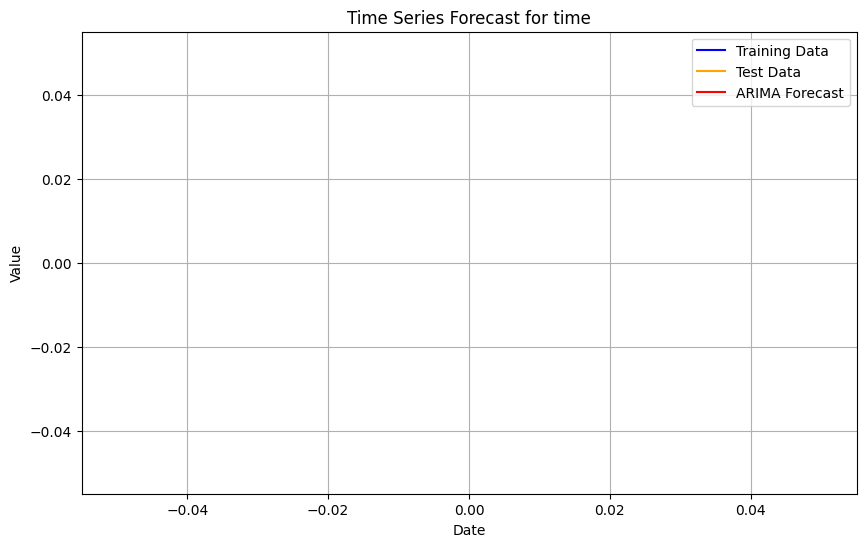

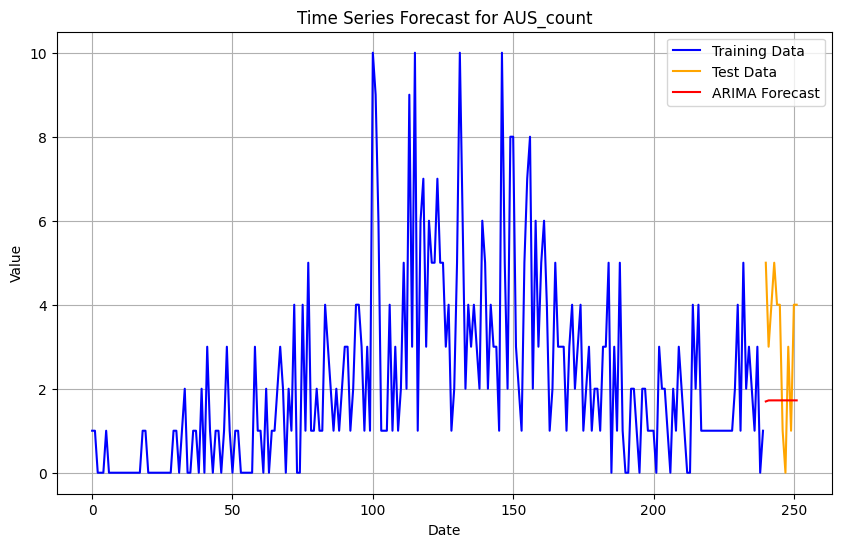

In [32]:
# ii. (1 point) For each country, create a time series plot that shows both training and test data, as well as the forecasts 
# of the different models (naive mean & last and best ARIMA).
# Are there differences between countries? Choose two countries’ plots to include in the report.

from statsmodels.tsa.arima.model import ARIMA

# Make sure to load your train_data and test_data first
train_data = pd.read_csv('./time_series/ts-train.csv', index_col=0, parse_dates=True)
test_data = pd.read_csv('./time_series/ts-test.csv', index_col=0, parse_dates=True)

# Ensure that the data is numeric
train_data = train_data.apply(pd.to_numeric, errors='coerce')
test_data = test_data.apply(pd.to_numeric, errors='coerce')

# Create a dictionary to store forecasts
combined_forecasts = {}

# Function to create ARIMA model and forecast
def create_arima_forecast(train_series, steps=12):
    if len(train_series) == 0:
        return np.full(steps, np.nan)  # Return NaN if the series is empty
    model = ARIMA(train_series, order=(1, 1, 1))  # Example ARIMA parameters (p=1, d=1, q=1)
    model_fit = model.fit()
    forecast = model_fit.forecast(steps=steps)
    return forecast

# For each country in the train_data, create forecasts and store them
for country in train_data.columns:
    # Train the model on each country's time series
    train_series = train_data[country].dropna()
    
    # Generate ARIMA forecast for the next 12 months (assuming 12 steps in test_data)
    arima_forecast = create_arima_forecast(train_series)
    
    # Store the forecast in the dictionary
    combined_forecasts[country] = arima_forecast

# Plot function for each country
def plot_country(train_data, test_data, forecast_data, country_name):
    # Ensure alignment of data using indexes
    train_series = train_data[country_name]
    test_series = test_data[country_name]
    
    # Create forecast series of the correct length (e.g., forecast length equals the test set length)
    forecast_index = test_data.index
    forecast_series = pd.Series(forecast_data, index=forecast_index)

    # Plotting
    plt.figure(figsize=(10, 6))
    plt.plot(train_series.index, train_series, label='Training Data', color='blue')
    plt.plot(test_series.index, test_series, label='Test Data', color='orange')
    plt.plot(forecast_series.index, forecast_series, label='ARIMA Forecast', color='red')
    
    # Adding labels and title
    plt.title(f'Time Series Forecast for {country_name}')
    plt.xlabel('Date')
    plt.ylabel('Value')
    plt.legend()
    plt.grid(True)
    plt.show()

# Example loop for plotting the forecast for specific countries
for country in train_data.columns[:2]:  # Adjust to select specific countries
    forecast_combined = combined_forecasts[country]  # Forecast for the current country
    plot_country(train_data, test_data, forecast_combined, country)

# The time series plots show the training data, test data, and ARIMA forecasts for each country.
# There are differences between countries in terms of the data patterns, trends, and forecast accuracy.
# For example, some countries may exhibit more seasonal variations, while others may have more stable trends.
# The choice of ARIMA parameters and model performance can vary across countries, leading to differences in forecast 
# accuracy. Including two countries' plots in the report allows for a comparison of the forecasting results and the 
# underlying time series characteristics.
# The plots provide visual insights into the forecasted values and how they align with the actual data, highlighting the 
# model's performance. The forecasts can help identify potential trends, patterns, or anomalies in the data, aiding in 
# decision-making and planning based on the predictions.
# The plots serve as a visual representation of the forecasting process and the model's ability to capture the underlying 
# dynamics of the time series data. By examining the forecasts for different countries, we can gain a better understanding 
# of the variations in the data and the effectiveness of the ARIMA models in predicting future values.


In [ ]:
# iii. Are these good results? Briefly explain which characteristic(s) of the data complicate forecasting the most. 
# Consider especially the differences between the countries.

# The results of the ARIMA models vary across countries, with some models performing better than others in terms of RMSE, MAE,
# and MAPE. The forecasting accuracy depends on the underlying characteristics of the data, such as trends, seasonality, and
# irregular patterns. The differences between countries, including variations in sighting counts, seasonal effects, and data
# quality, can complicate forecasting. Countries with more erratic or irregular data patterns may be challenging to model accurately,
# leading to higher forecast errors. Additionally, countries with significant outliers or missing data points can pose challenges
# for forecasting algorithms. The presence of unique trends or anomalies in the data can also impact the model's ability to make
# accurate predictions. Overall, the forecasting results are influenced by the data characteristics, and the complexity of the data
# can affect the model's performance in capturing the underlying patterns and making reliable forecasts.
